# Predicting Rental Prices in Brazil

Our goals in this kernel are:

- Basic Exploratory Data Analysis.
- Guide on brazilian_houses_to_rent Dataset available on Kaggle.

Our dependent variable it is **rent amount (R$)**. This variable it's the price of rental houses in Brazil and its measured in brazilian currency - Reais.

The data were provided from [this](https://www.kaggle.com/rubenssjr/brasilian-houses-to-rent) dataset.

## Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

ModuleNotFoundError: No module named 'seaborn'

## Import Dataset

In [6]:
df = pd.read_csv(os.path.join(os.path.abspath('../data'), 'houses_to_rent_v2.csv'))

In [7]:
df.head()

,city,area,rooms,bathroom,parking spaces,floor,animal,furniture,hoa (R$),rent amount (R$),property tax (R$),fire insurance (R$),total (R$)
0,São Paulo,70,2,1,1,7,acept,furnished,2065,3300,211,42,5618
1,São Paulo,320,4,4,0,20,acept,not furnished,1200,4960,1750,63,7973
2,Porto Alegre,80,1,1,1,6,acept,not furnished,1000,2800,0,41,3841
3,Porto Alegre,51,2,1,0,2,acept,not furnished,270,1112,22,17,1421
4,São Paulo,25,1,1,0,1,not acept,not furnished,0,800,25,11,836


## Descriptive Statistics

In [4]:
df.shape

(10692, 13)

In [5]:
df.describe()

,area,rooms,bathroom,parking spaces,hoa (R$),rent amount (R$),property tax (R$),fire insurance (R$),total (R$)
count,10692.000000,10692.000000,10692.000000,10692.000000,1.069200e+04,10692.000000,10692.000000,10692.000000,1.069200e+04
mean,149.217920,2.506079,2.236813,1.609147,1.174022e+03,3896.247194,366.704358,53.300879,5.490487e+03
std,537.016942,1.171266,1.407198,1.589521,1.559231e+04,3408.545518,3107.832321,47.768031,1.648473e+04
min,11.000000,1.000000,1.000000,0.000000,0.000000e+00,450.000000,0.000000,3.000000,4.990000e+02
25%,56.000000,2.000000,1.000000,0.000000,1.700000e+02,1530.000000,38.000000,21.000000,2.061750e+03
50%,90.000000,2.000000,2.000000,1.000000,5.600000e+02,2661.000000,125.000000,36.000000,3.581500e+03
75%,182.000000,3.000000,3.000000,2.000000,1.237500e+03,5000.000000,375.000000,68.000000,6.768000e+03
max,46335.000000,13.000000,10.000000,12.000000,1.117000e+06,45000.000000,313700.000000,677.000000,1.120000e+06


Apparently that are outliers in our dataset.

In [6]:
df.describe(include = 'object')

,city,floor,animal,furniture
count,10692,10692,10692,10692
unique,5,35,2,2
top,São Paulo,-,acept,not furnished
freq,5887,2461,8316,8086


In [7]:
df.isnull().sum()

city                   0
area                   0
rooms                  0
bathroom               0
parking spaces         0
floor                  0
animal                 0
furniture              0
hoa (R$)               0
rent amount (R$)       0
property tax (R$)      0
fire insurance (R$)    0
total (R$)             0
dtype: int64

In [8]:
df.duplicated().sum()

358

We can see that we have 358 duplicated values in our dataset. 

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10692 entries, 0 to 10691
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   city                 10692 non-null  object
 1   area                 10692 non-null  int64 
 2   rooms                10692 non-null  int64 
 3   bathroom             10692 non-null  int64 
 4   parking spaces       10692 non-null  int64 
 5   floor                10692 non-null  object
 6   animal               10692 non-null  object
 7   furniture            10692 non-null  object
 8   hoa (R$)             10692 non-null  int64 
 9   rent amount (R$)     10692 non-null  int64 
 10  property tax (R$)    10692 non-null  int64 
 11  fire insurance (R$)  10692 non-null  int64 
 12  total (R$)           10692 non-null  int64 
dtypes: int64(9), object(4)
memory usage: 1.1+ MB


**Inicial observations:**

There are 13 features and 10692 instances
- There are no NaN Values
- Most columns are numerical
- There are columns with the wrong type
- Most houses accept animals
- Most houses are not furnished
- São Paulo is the city with more houses
- There are potencial outliers

## Check for anomalities

In [10]:
def categorize(columns):
    """
    This function return categorical and numerical values for a given dataframe
    """
    numerical,category=[],[]
    for i in columns:
        if df[i].dtype==object:
            category.append(i)
        else:
            numerical.append(i)
    print(f"The numerical features: {numerical}")
    print(f"The categorical features: {category}")
    return category,numerical

In [11]:
categorical, numerical = categorize(df)

The numerical features: ['area', 'rooms', 'bathroom', 'parking spaces', 'hoa (R$)', 'rent amount (R$)', 'property tax (R$)', 'fire insurance (R$)', 'total (R$)']
The categorical features: ['city', 'floor', 'animal', 'furniture']


We can see that floor was supposed to be a numerical column, so let's see what is happening

In [12]:
for column in categorical:
    print(f'We are analyzing *{column}* unique values\n')
    print(df[column].unique().tolist())
    print('\n')
    print('*'*100)
    print('\n')

We are analyzing *city* unique values

['São Paulo', 'Porto Alegre', 'Rio de Janeiro', 'Campinas', 'Belo Horizonte']


****************************************************************************************************


We are analyzing *floor* unique values

['7', '20', '6', '2', '1', '-', '4', '3', '10', '11', '24', '9', '8', '17', '18', '5', '13', '15', '16', '14', '26', '12', '21', '19', '22', '27', '23', '35', '25', '46', '28', '29', '301', '51', '32']


****************************************************************************************************


We are analyzing *animal* unique values

['acept', 'not acept']


****************************************************************************************************


We are analyzing *furniture* unique values

['furnished', 'not furnished']


****************************************************************************************************




Apparently, the only anomaly that we have it is a '-' value in floor column. So, let's explore a little bit of it and remove floor from categorical in order to better data exploration.

In [13]:
categorical.remove('floor')

In [14]:
df.loc[df['floor'] != '-']['floor'].astype(int).describe()

count    8231.000000
mean        6.583283
std         6.153925
min         1.000000
25%         2.000000
50%         5.000000
75%         9.000000
max       301.000000
Name: floor, dtype: float64

Apparently there are outliers in floor column.

## Data Visualization

### Let's see the distribution of the target variable

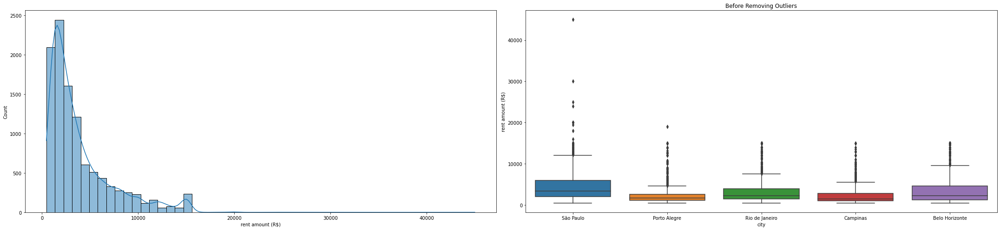

In [31]:
plt.figure(figsize=(30, 7))
plt.subplot(1, 2, 1)
sns.histplot(df['rent amount (R$)'],kde=True,bins=50)
plt.subplot(1, 2, 2)
sns.boxplot(x=df['city'], y=df['rent amount (R$)']).set_title('Before Removing Outliers')
plt.tight_layout()

Apparently, there are some some outliers in the target variable, but it's not alarming.

The target variable it's not normally distributed, that was expected.

Accordingly to our descriptive statistics, hoa, property tax and area have potential outliers, let's check their distribution

<AxesSubplot:xlabel='area'>

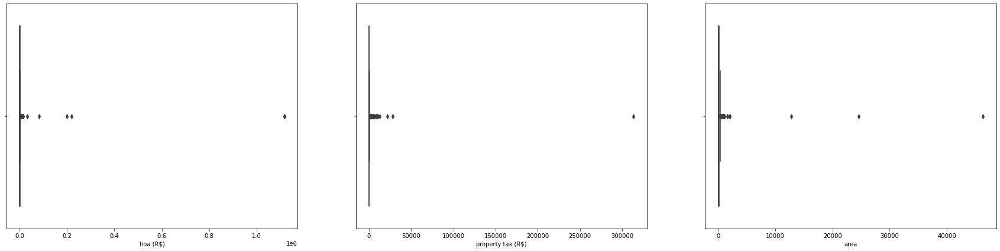

In [32]:
plt.figure(figsize=(30, 7))
plt.subplot(1, 3, 1)
sns.boxplot(x='hoa (R$)', data=df)
plt.subplot(1, 3, 2)
sns.boxplot(x='property tax (R$)', data=df)
plt.subplot(1, 3, 3)
sns.boxplot(x='area', data=df)

Ok, we can see that these columns have very visible outliers. Let's see if they are correlated.

In [48]:
df.loc[(df['area'] > df['area'].quantile(0.99)) | (df['hoa (R$)'] > df['hoa (R$)'].quantile(0.99)) | (df['property tax (R$)'] > df['property tax (R$)'].quantile(0.99))]

,city,area,rooms,bathroom,parking spaces,floor,animal,furniture,hoa (R$),rent amount (R$),property tax (R$),fire insurance (R$),total (R$)
19,São Paulo,600,4,5,6,-,acept,not furnished,0,12000,9500,181,21680
86,São Paulo,600,4,4,4,9,acept,not furnished,7400,8500,3368,108,19380
131,São Paulo,900,4,6,8,-,acept,not furnished,0,15000,4417,226,19640
143,Campinas,999,5,7,8,-,acept,not furnished,0,14000,667,211,14880
157,São Paulo,660,4,5,5,12,acept,furnished,4800,20000,1750,254,26800
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10426,São Paulo,600,4,3,3,1,acept,not furnished,6000,3750,1667,48,11470
10451,São Paulo,900,5,5,5,-,not acept,not furnished,0,15000,3334,226,18560
10472,Campinas,900,3,6,8,-,acept,not furnished,2000,15000,1834,226,19060
10480,São Paulo,399,3,5,4,21,acept,not furnished,7000,12000,0,153,19150


I'm using the 99 quantile just to get the 1% left of every column and see if there are more than one column with outliers in the registers. Apparently there are some relation.

### Let's explore our numerical features

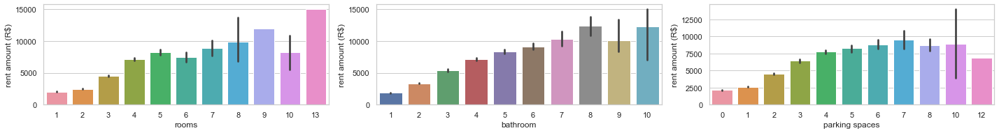

In [33]:
# Since we are going to plot barplot's, let's only select a few columns to this specific type of graphic.

numerical1 = ['rooms', 'bathroom', 'parking spaces']
plt.figure(figsize=(20, 5))
sns.set(style = 'whitegrid')
i = 1
for feature in numerical1:
    plt.subplot(2, 3, i)
    sns.barplot(x = feature, y= 'rent amount (R$)', data=df)
    i+=1
plt.tight_layout()

- Houses with more rooms have more expensive rents, except for houses with 10 rooms when it decreases
- The rent increases until 8 bathrooms, beyond that curiously decreases
- Rent increases until 7 parking spaces, when it behave strangely, probably due to few samples

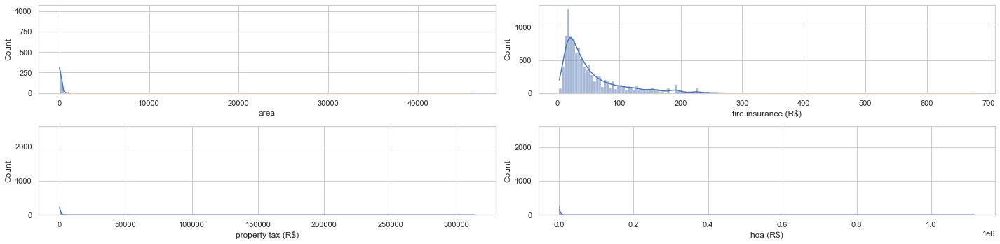

In [34]:
# Now, let's plot histograms to all continuous numerical variables

numerical2 = ['area', 'fire insurance (R$)', 'property tax (R$)', 'hoa (R$)']
plt.figure(figsize=(20, 5))
j = 1
for feature2 in numerical2:
    plt.subplot(2, 2, j)
    sns.histplot(df[feature2],kde=True)
    j+=1
plt.tight_layout()

**All the distributions are right skewed**

### Lets take a deeper look about how the prices are distributed in the city's

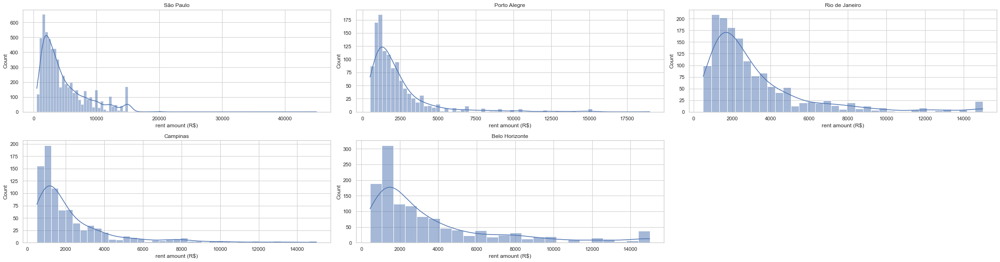

In [35]:
plt.figure(figsize=(30, 8))

i = 1
for city in df['city'].unique():
    plt.subplot(2, 3, i)
    plt.title(city)
    city_name = df.loc[df['city'] == city]
    sns.histplot(city_name['rent amount (R$)'],kde=True)
    i+=1
    

plt.tight_layout()
plt.show()

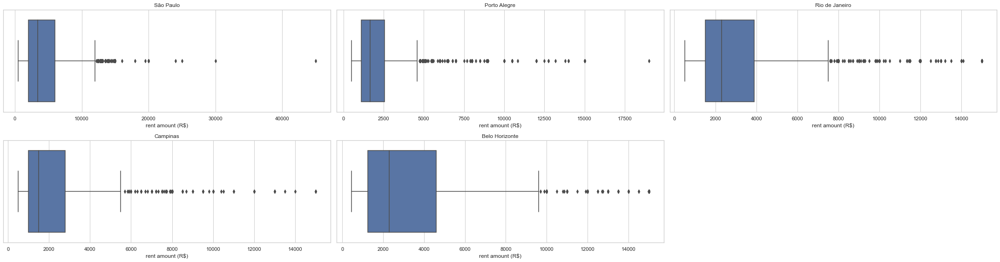

In [36]:
plt.figure(figsize=(30, 8))

i = 1
for city in df['city'].unique():
    plt.subplot(2, 3, i)
    plt.title(city)
    city_name = df.loc[df['city'] == city]
    sns.boxplot(x=city_name['rent amount (R$)'])    
    i+=1

plt.tight_layout()
plt.show()

- São Paulo appear to have the most expensive rent.
- Belo Horizonte and Rio de Janeiro have slightly more expensive rents than Campinas and Porto Alegre.

### Getting the intution about all the categorical features

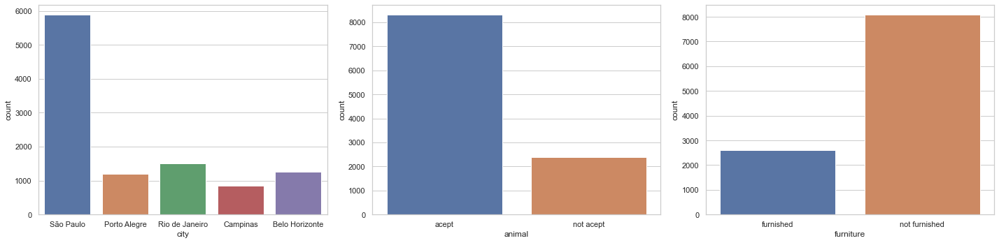

In [42]:
plt.figure(figsize=(20,5))
j =1
for i in categorical:
    plt.subplot(1,3,j)
    sns.countplot(x=df[i])
    j =j+1
plt.tight_layout()

- São Paulo is the city with more houses
- The majority of the houses accept animals
- The majority of the houses are not furnished

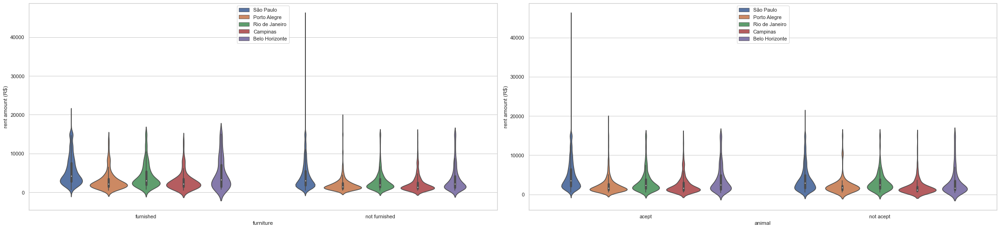

In [43]:
# Let's take a look about how the rent and animal acceptance is impacted by the furniture
plt.figure(figsize = (30, 7))
plt.subplot(1, 2, 1)
sns.violinplot(x ='furniture', y ='rent amount (R$)', data = df,hue ='city').legend(loc='upper center')
plt.subplot(1, 2, 2)
sns.violinplot(x ='animal', y ='rent amount (R$)', data = df,hue ='city').legend(loc='upper center')
plt.tight_layout()

Apparently, furnished may impact the price due to the distribution, we have to look it more carefully. Animal acceptance doesn't seem to have any visible effect on the price.

<AxesSubplot:>

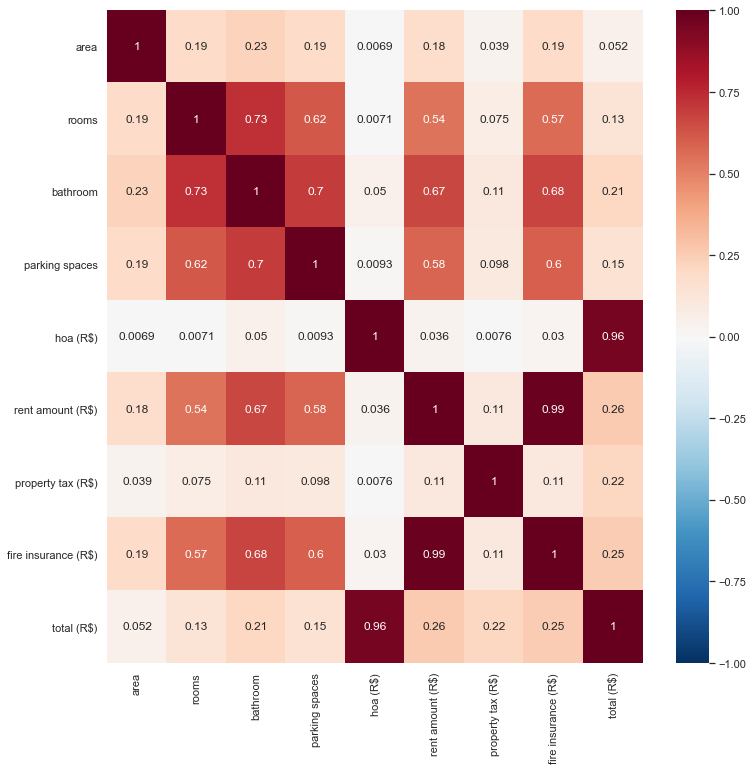

In [44]:
# Finally, let's see the correlation between features
plt.figure(figsize=(12,12))
sns.heatmap(df.corr(), annot=True, cmap='RdBu_r', linecolor='black',vmin=-1, vmax=1)

The variables that better describe rent amount are:
- fire insurance
- parking spaces
- bathroom
- rooms